In [28]:
import pandas as pd
import numpy as np 
import acquire
import prepare
import pandas as pd
import numpy as np
import os
import scipy.stats as stats
from sklearn.impute import SimpleImputer
import sklearn.preprocessing
# Viz imports
import matplotlib.pyplot as plt
import seaborn as sns

# Modeling imports
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier, plot_tree, export_text
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
import warnings
warnings.filterwarnings("ignore")
# Custom module imports
import acquire
import prepare
α = .05
alpha= .05

# acquire and prepare data:

# sql acquire:

In [29]:
#acquire from sql basic version
df=acquire.sqlclean_zillow()
df.head()

,bedroomcnt,bathroomcnt,calculatedfinishedsquarefeet,taxvaluedollarcnt,yearbuilt,fips,regionidcounty,regionidzip,numberofstories,latitude,longitude
0,3.0,2.0,1209.0,185000.0,1987.0,6037.0,3101.0,97328.0,NaN,34554158.0,-118074635.0
1,2.0,1.0,942.0,32050.0,1908.0,6037.0,3101.0,96013.0,NaN,34089443.0,-118170716.0
2,4.0,3.0,3092.0,1380739.0,1957.0,6037.0,3101.0,96412.0,NaN,34134836.0,-118476275.0
3,4.0,5.0,3828.0,817802.0,1969.0,6037.0,3101.0,96100.0,NaN,33954505.0,-118118928.0
4,5.0,3.0,3304.0,665343.0,1991.0,6059.0,1286.0,97078.0,NaN,33908686.0,-117760654.0


In [30]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 52442 entries, 0 to 52441
Data columns (total 11 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   bedroomcnt                    52442 non-null  float64
 1   bathroomcnt                   52442 non-null  float64
 2   calculatedfinishedsquarefeet  52360 non-null  float64
 3   taxvaluedollarcnt             52441 non-null  float64
 4   yearbuilt                     52326 non-null  float64
 5   fips                          52442 non-null  float64
 6   regionidcounty                52442 non-null  float64
 7   regionidzip                   52416 non-null  float64
 8   numberofstories               14561 non-null  float64
 9   latitude                      52442 non-null  float64
 10  longitude                     52442 non-null  float64
dtypes: float64(11)
memory usage: 4.4 MB


In [31]:
#prepare zillow using sql
df=prepare.prep_zillow(df)
df.head()

,Bedrooms,Bathrooms,Squarefeet,TaxesTotal,Year,County,Zip,latitude,longitude,TotalRooms,Decade,location,los_angeles,orange,ventura
0,3.0,2.0,1209.0,185000.0,1987.0,3101.0,97328.0,34554158.0,-118074635.0,5.0,1980,Los_Angeles,1,0,0
1,2.0,1.0,942.0,32050.0,1908.0,3101.0,96013.0,34089443.0,-118170716.0,3.0,1900,Los_Angeles,1,0,0
2,4.0,3.0,3092.0,1380739.0,1957.0,3101.0,96412.0,34134836.0,-118476275.0,7.0,1950,Los_Angeles,1,0,0
3,4.0,5.0,3828.0,817802.0,1969.0,3101.0,96100.0,33954505.0,-118118928.0,9.0,1960,Los_Angeles,1,0,0
4,5.0,3.0,3304.0,665343.0,1991.0,1286.0,97078.0,33908686.0,-117760654.0,8.0,1990,Orange,0,1,0


In [32]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 52442 entries, 0 to 52441
Data columns (total 15 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Bedrooms     52442 non-null  float64
 1   Bathrooms    52442 non-null  float64
 2   Squarefeet   52442 non-null  float64
 3   TaxesTotal   52442 non-null  float64
 4   Year         52442 non-null  float64
 5   County       52442 non-null  float64
 6   Zip          52442 non-null  float64
 7   latitude     52442 non-null  float64
 8   longitude    52442 non-null  float64
 9   TotalRooms   52442 non-null  float64
 10  Decade       52442 non-null  int64  
 11  location     52442 non-null  object 
 12  los_angeles  52442 non-null  int64  
 13  orange       52442 non-null  int64  
 14  ventura      52442 non-null  int64  
dtypes: float64(10), int64(4), object(1)
memory usage: 6.0+ MB


In [33]:
df.describe()

,Bedrooms,Bathrooms,Squarefeet,TaxesTotal,Year,County,Zip,latitude,longitude,TotalRooms,Decade,los_angeles,orange,ventura
count,52442.000000,52442.000000,52442.000000,5.244200e+04,52442.000000,52442.000000,52442.000000,5.244200e+04,5.244200e+04,52442.000000,52442.000000,52442.000000,52442.000000,52442.000000
mean,3.300675,2.299397,1919.867415,5.296729e+05,1959.050856,2524.598642,96587.932878,3.402254e+07,-1.181942e+08,5.600072,1952.985775,0.646638,0.269555,0.083807
std,0.949086,1.022764,1006.449799,7.518847e+05,95.090571,803.986272,5081.710240,2.739761e+05,3.566615e+05,1.791627,95.225216,0.478018,0.443733,0.277101
min,0.000000,0.000000,0.000000,0.000000e+00,0.000000,1286.000000,0.000000,3.334062e+07,-1.194754e+08,0.000000,0.000000,0.000000,0.000000,0.000000
25%,3.000000,2.000000,1266.000000,1.937425e+05,1950.000000,1286.000000,96206.000000,3.382691e+07,-1.184007e+08,5.000000,1940.000000,0.000000,0.000000,0.000000
50%,3.000000,2.000000,1657.000000,3.736115e+05,1960.000000,3101.000000,96412.000000,3.402377e+07,-1.181531e+08,5.000000,1950.000000,1.000000,0.000000,0.000000
75%,4.000000,3.000000,2304.000000,6.192878e+05,1979.000000,3101.000000,96995.000000,3.418715e+07,-1.179292e+08,6.500000,1970.000000,1.000000,1.000000,0.000000
max,14.000000,18.000000,21929.000000,4.906124e+07,2016.000000,3101.000000,399675.000000,3.481877e+07,-1.175546e+08,32.000000,2010.000000,1.000000,1.000000,1.000000


# acquire/prepare zillow using cvs

In [5]:
#added this in my prepare function
df.Decade = df.Decade.astype(int)

AttributeError: 'DataFrame' object has no attribute 'Decade'

In [3]:
#using the acquire.py to acquire a clean version of zillow csv 
df=acquire.clean_zillow2()
df

,Parcelid,Bathrooms,Bedrooms,Squarefeet,Fips,latitude,longitude,County,Zip,Year,Stories,TaxesTotal
0,17223154,2.5,4,2088.0,6111,34238617,-118813281,2061,97118.0,1990.0,2.0,562348.0
1,17223031,3.0,4,2572.0,6111,34235499,-118808366,2061,97118.0,1994.0,2.0,444563.0
2,17222931,3.5,4,3213.0,6111,34243775,-118812925,2061,97118.0,1994.0,2.0,613950.0
3,17222339,2.0,3,2170.0,6111,34244934,-118803182,2061,97118.0,1987.0,1.0,622294.0
4,17222139,2.0,2,1457.0,6111,34247692,-118818283,2061,97118.0,1986.0,2.0,538000.0
...,...,...,...,...,...,...,...,...,...,...,...,...
56075,11040656,2.0,3,1184.0,6037,34259974,-118468797,3101,96371.0,1953.0,NaN,165419.0
56076,11039751,3.0,4,1815.0,6037,34261456,-118453953,3101,96371.0,1966.0,NaN,207720.0
56077,11038761,2.0,2,1429.0,6037,34250254,-118456404,3101,96371.0,1952.0,NaN,408897.0
56078,11038661,2.0,3,1426.0,6037,34251544,-118453735,3101,96371.0,1952.0,NaN,419009.0


In [2]:
#csv acquire
df=pd.read_csv('zillow3.csv')
df.head()

,propertylandusetypeid,id,parcelid,airconditioningtypeid,architecturalstyletypeid,basementsqft,bathroomcnt,bedroomcnt,buildingclasstypeid,buildingqualitytypeid,...,assessmentyear,landtaxvaluedollarcnt,taxamount,taxdelinquencyflag,taxdelinquencyyear,censustractandblock,parcelid.1,logerror,transactiondate,propertylandusedesc
0,261,941,17223154,NaN,NaN,NaN,2.5,4,NaN,NaN,...,2016,281174.0,6405.58,NaN,NaN,6.111008e+13,14710129,-0.002189,2017-01-05,Single Family Residential
1,261,940,17223031,NaN,NaN,NaN,3.0,4,NaN,NaN,...,2016,173460.0,5151.84,NaN,NaN,6.111008e+13,12477465,0.053014,2017-01-05,Single Family Residential
2,261,939,17222931,NaN,NaN,NaN,3.5,4,NaN,NaN,...,2016,216064.0,7042.40,NaN,NaN,6.111008e+13,14608599,0.010948,2017-01-05,Single Family Residential
3,261,937,17222339,NaN,NaN,NaN,2.0,3,NaN,NaN,...,2016,311147.0,7143.40,NaN,NaN,6.111008e+13,12473718,0.053193,2017-01-05,Single Family Residential
4,261,935,17222139,NaN,NaN,NaN,2.0,2,NaN,NaN,...,2016,268000.0,6153.12,NaN,NaN,6.111008e+13,14603860,0.080817,2017-01-05,Single Family Residential


In [5]:
#prepare sql data by replacing the null with 0 and dropping columns plus renaming some


In [4]:
df=df.drop(columns=['taxamount','taxdelinquencyflag','taxdelinquencyyear','censustractandblock','assessmentyear',
                 'buildingqualitytypeid','buildingclasstypeid','decktypeid','calculatedbathnbr','fireplaceflag',
                 'structuretaxvaluedollarcnt','landtaxvaluedollarcnt','basementsqft','architecturalstyletypeid',
                "unitcnt",'yardbuildingsqft17','yardbuildingsqft26','parcelid.1','typeconstructiontypeid',
                'threequarterbathnbr','finishedsquarefeet13','finishedsquarefeet12','finishedfloor1squarefeet',
                 'finishedsquarefeet6','finishedsquarefeet50','finishedsquarefeet15','regionidneighborhood',
                 'fullbathcnt','fireplacecnt','roomcnt','garagecarcnt','garagetotalsqft','regionidcity',
                'hashottuborspa','rawcensustractandblock','propertyzoningdesc','storytypeid','logerror','pooltypeid2',
                'pooltypeid7','pooltypeid10','propertycountylandusecode','poolsizesum','poolcnt','heatingorsystemtypeid',
                'airconditioningtypeid','lotsizesquarefeet','propertylandusetypeid','id','transactiondate','propertylandusedesc'])

In [5]:
df.head()

,parcelid,bathroomcnt,bedroomcnt,calculatedfinishedsquarefeet,fips,latitude,longitude,regionidcounty,regionidzip,yearbuilt,numberofstories,taxvaluedollarcnt
0,17223154,2.5,4,2088.0,6111,34238617,-118813281,2061,97118.0,1990.0,2.0,562348.0
1,17223031,3.0,4,2572.0,6111,34235499,-118808366,2061,97118.0,1994.0,2.0,444563.0
2,17222931,3.5,4,3213.0,6111,34243775,-118812925,2061,97118.0,1994.0,2.0,613950.0
3,17222339,2.0,3,2170.0,6111,34244934,-118803182,2061,97118.0,1987.0,1.0,622294.0
4,17222139,2.0,2,1457.0,6111,34247692,-118818283,2061,97118.0,1986.0,2.0,538000.0


In [6]:
df = df.rename(columns={'bedroomcnt': 'Bedrooms', 'bathroomcnt': 'Bathrooms','calculatedfinishedsquarefeet':'Squarefeet',
                       "taxvaluedollarcnt":'TaxesTotal','yearbuilt':'Year','fips':'Fips','regionidcounty':'County','regionidzip':'Zip','numberofstories':'Stories'
                       ,'parcelid':'Parcelid'})
df.head()

,Parcelid,Bathrooms,Bedrooms,Squarefeet,Fips,latitude,longitude,County,Zip,Year,Stories,TaxesTotal
0,17223154,2.5,4,2088.0,6111,34238617,-118813281,2061,97118.0,1990.0,2.0,562348.0
1,17223031,3.0,4,2572.0,6111,34235499,-118808366,2061,97118.0,1994.0,2.0,444563.0
2,17222931,3.5,4,3213.0,6111,34243775,-118812925,2061,97118.0,1994.0,2.0,613950.0
3,17222339,2.0,3,2170.0,6111,34244934,-118803182,2061,97118.0,1987.0,1.0,622294.0
4,17222139,2.0,2,1457.0,6111,34247692,-118818283,2061,97118.0,1986.0,2.0,538000.0


In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 56080 entries, 0 to 56079
Data columns (total 12 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Parcelid    56080 non-null  int64  
 1   Bathrooms   56080 non-null  float64
 2   Bedrooms    56080 non-null  int64  
 3   Squarefeet  55849 non-null  float64
 4   Fips        56080 non-null  int64  
 5   latitude    56080 non-null  int64  
 6   longitude   56080 non-null  int64  
 7   County      56080 non-null  int64  
 8   Zip         55980 non-null  float64
 9   Year        55831 non-null  float64
 10  Stories     15493 non-null  float64
 11  TaxesTotal  56072 non-null  float64
dtypes: float64(6), int64(6)
memory usage: 5.1 MB


# cleaning data up

In [14]:
df=df.replace('','0')
df.head()

,Parcelid,Bathrooms,Bedrooms,Squarefeet,Fips,latitude,longitude,County,Zip,Year,Stories,TaxesTotal
0,17223154,2.5,4,2088.0,6111,34238617,-118813281,2061,97118.0,1990.0,2.0,562348.0
1,17223031,3.0,4,2572.0,6111,34235499,-118808366,2061,97118.0,1994.0,2.0,444563.0
2,17222931,3.5,4,3213.0,6111,34243775,-118812925,2061,97118.0,1994.0,2.0,613950.0
3,17222339,2.0,3,2170.0,6111,34244934,-118803182,2061,97118.0,1987.0,1.0,622294.0
4,17222139,2.0,2,1457.0,6111,34247692,-118818283,2061,97118.0,1986.0,2.0,538000.0


In [17]:
df.Fips = df.Fips.astype(object)
df.Year = df.Year.astype(object)
df['TotalRooms'] = df['Bathrooms']+df['Bedrooms']
df.head()

,Parcelid,Bathrooms,Bedrooms,Squarefeet,Fips,latitude,longitude,County,Zip,Year,Stories,TaxesTotal,TotalRooms
0,17223154,2.5,4,2088.0,6111,34238617,-118813281,2061,97118.0,1990.0,2.0,562348.0,6.5
1,17223031,3.0,4,2572.0,6111,34235499,-118808366,2061,97118.0,1994.0,2.0,444563.0,7.0
2,17222931,3.5,4,3213.0,6111,34243775,-118812925,2061,97118.0,1994.0,2.0,613950.0,7.5
3,17222339,2.0,3,2170.0,6111,34244934,-118803182,2061,97118.0,1987.0,1.0,622294.0,5.0
4,17222139,2.0,2,1457.0,6111,34247692,-118818283,2061,97118.0,1986.0,2.0,538000.0,4.0


In [28]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 52442 entries, 0 to 52441
Data columns (total 12 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   Bedrooms    52442 non-null  float64 
 1   Bathrooms   52442 non-null  float64 
 2   Squarefeet  52360 non-null  float64 
 3   TaxesTotal  52441 non-null  float64 
 4   Year        52326 non-null  object  
 5   Fips        52442 non-null  object  
 6   County      52442 non-null  float64 
 7   Zip         52416 non-null  float64 
 8   latitude    52442 non-null  float64 
 9   longitude   52442 non-null  float64 
 10  TotalRooms  52442 non-null  float64 
 11  Decade      52326 non-null  category
dtypes: category(1), float64(9), object(2)
memory usage: 4.5+ MB


In [7]:
df.describe()

,Bedrooms,Bathrooms,Squarefeet,TaxesTotal,County,Zip,latitude,longitude,TotalRooms
count,52442.000000,52442.000000,52360.000000,5.244100e+04,52442.000000,52416.000000,5.244200e+04,5.244200e+04,52442.000000
mean,3.300675,2.299397,1922.874083,5.296830e+05,2524.598642,96635.843559,3.402254e+07,-1.181942e+08,5.600072
std,0.949086,1.022764,1004.363491,7.518883e+05,803.986272,4605.063649,2.739761e+05,3.566615e+05,1.791627
min,0.000000,0.000000,128.000000,1.000000e+03,1286.000000,95982.000000,3.334062e+07,-1.194754e+08,0.000000
25%,3.000000,2.000000,1268.000000,1.937500e+05,1286.000000,96206.000000,3.382691e+07,-1.184007e+08,5.000000
50%,3.000000,2.000000,1659.000000,3.736120e+05,3101.000000,96412.000000,3.402377e+07,-1.181531e+08,5.000000
75%,4.000000,3.000000,2306.000000,6.193010e+05,3101.000000,96995.000000,3.418715e+07,-1.179292e+08,6.500000
max,14.000000,18.000000,21929.000000,4.906124e+07,3101.000000,399675.000000,3.481877e+07,-1.175546e+08,32.000000


In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 52442 entries, 0 to 52441
Data columns (total 14 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Bedrooms     52442 non-null  float64
 1   Bathrooms    52442 non-null  float64
 2   Squarefeet   52442 non-null  float64
 3   TaxesTotal   52442 non-null  float64
 4   Year         52442 non-null  float64
 5   County       52442 non-null  float64
 6   Zip          52442 non-null  float64
 7   latitude     52442 non-null  float64
 8   longitude    52442 non-null  float64
 9   TotalRooms   52442 non-null  float64
 10  location     52442 non-null  object 
 11  los_angeles  52442 non-null  int64  
 12  orange       52442 non-null  int64  
 13  ventura      52442 non-null  int64  
dtypes: float64(10), int64(3), object(1)
memory usage: 5.6+ MB


In [10]:
def plot_variable_pairs(df):
    cats = ['Bedrooms', 'Bathrooms',  'Year',"County"]
    nums = ['Squarefeet', 'TotalRooms', 'TaxesTotal','los_angeles']
    
    # make correlation plot
    df_corr = df.drop(columns=['Zip']).corr()
    plt.figure(figsize=(12,8))
    sns.set_theme(style="darkgrid")
    sns.pairplot(df[nums].sample(1000), corner=True, kind='reg',plot_kws={'line_kws':{'color':'red'}})
    plt.show()

<Figure size 864x576 with 0 Axes>

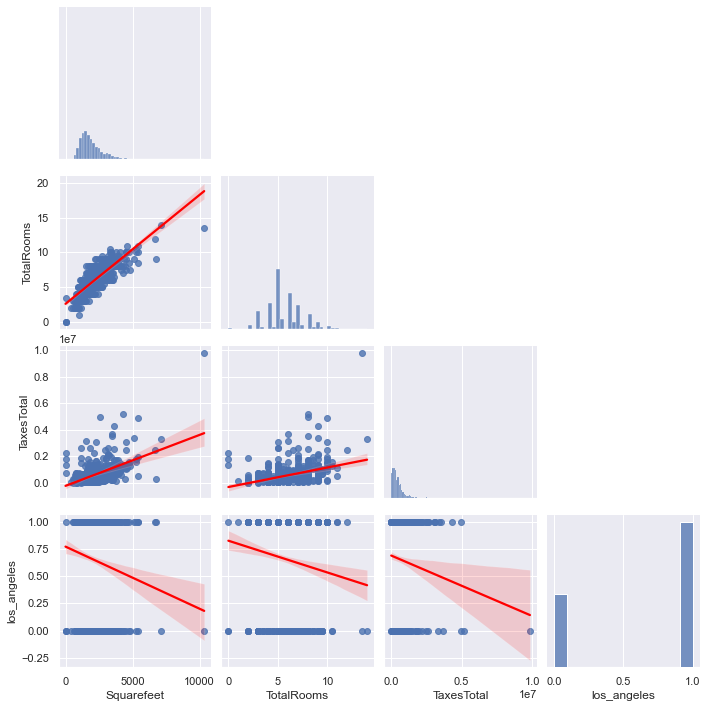

In [11]:
plot_variable_pairs(df) 

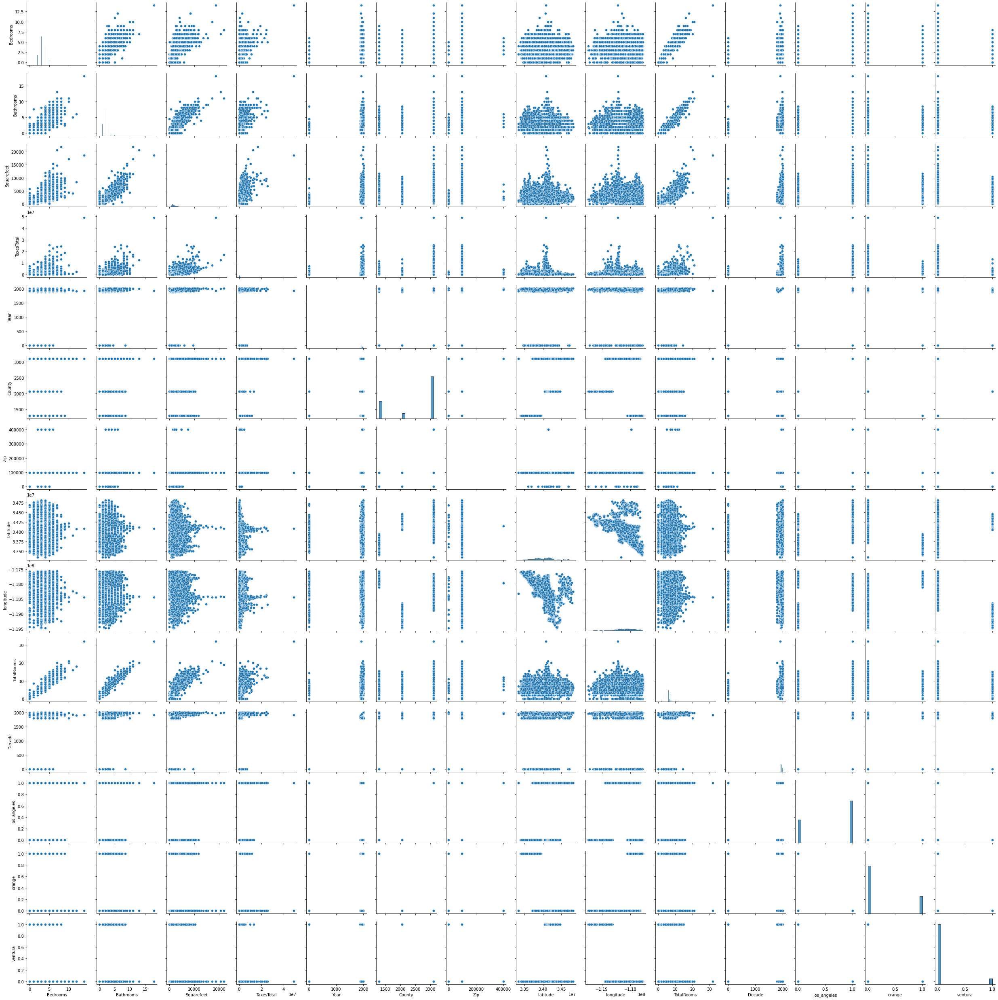

In [21]:
sns.pairplot(data=df)

# Do bedrooms effect tax total,separed by locations:

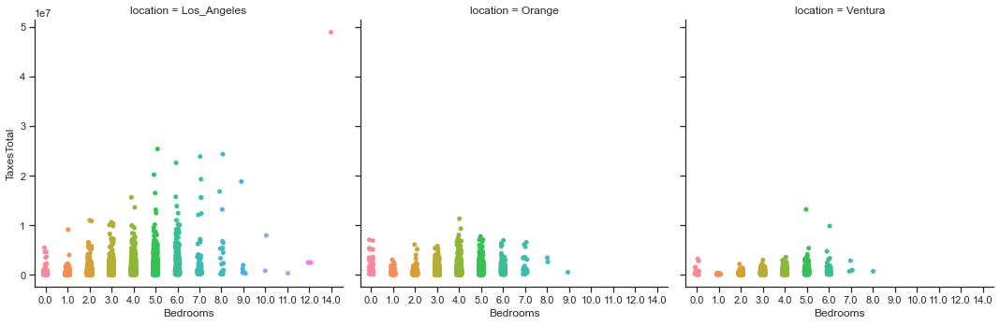

In [12]:
sns.set_theme(style="ticks")
sns.catplot(x="Bedrooms", y="TaxesTotal",col='location',data=df)

<Figure size 576x576 with 0 Axes>

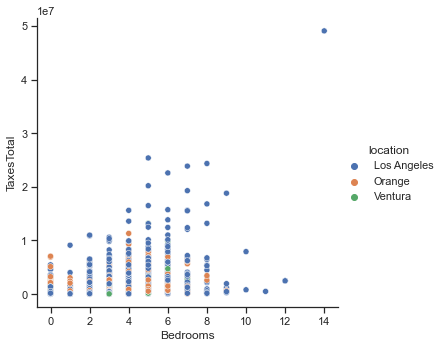

In [39]:
plt.figure(figsize=(8,8))
sns.relplot(data=df, x="Bedrooms", y="TaxesTotal", hue="location")
plt.show()

# Do bath rooms effect tax total? separed by locations:

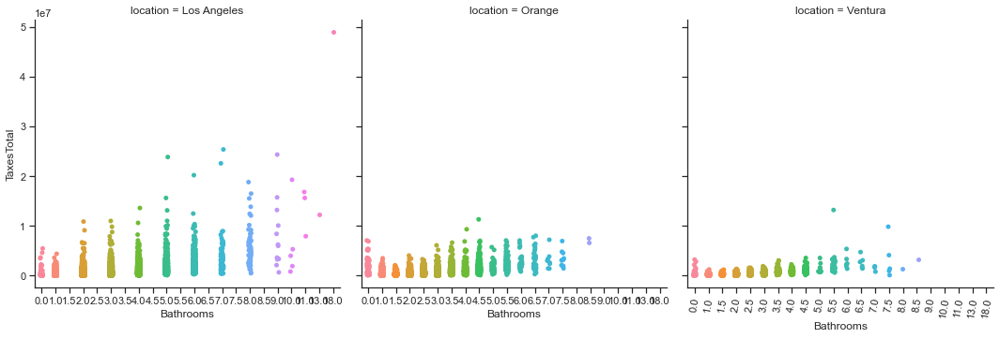

In [45]:
sns.set_theme(style="ticks")
sns.catplot(x="Bathrooms", y="TaxesTotal",col='location',data=df)
plt.xticks(rotation=80)
plt.show()

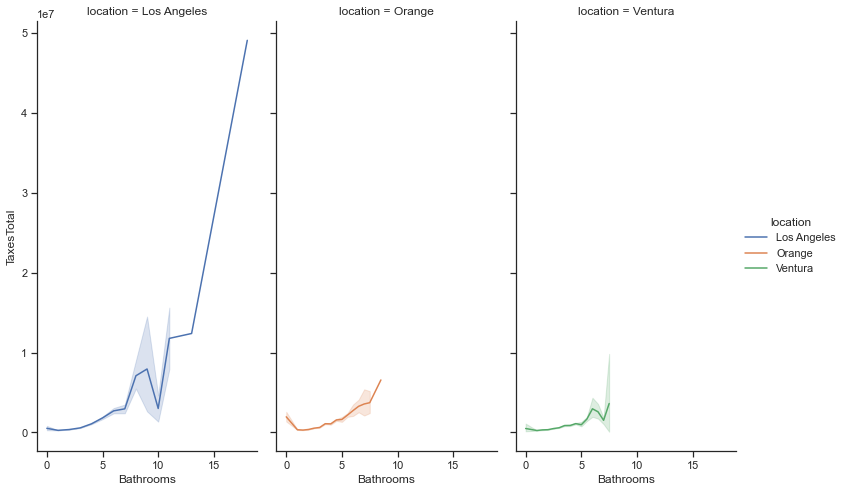

In [56]:
sns.relplot(
    data=train, x="Bathrooms", y="TaxesTotal", col="location",
    hue="location", kind="line",height=7, aspect=.5)
plt.show()

# More squarefeet equals higher taxes ??

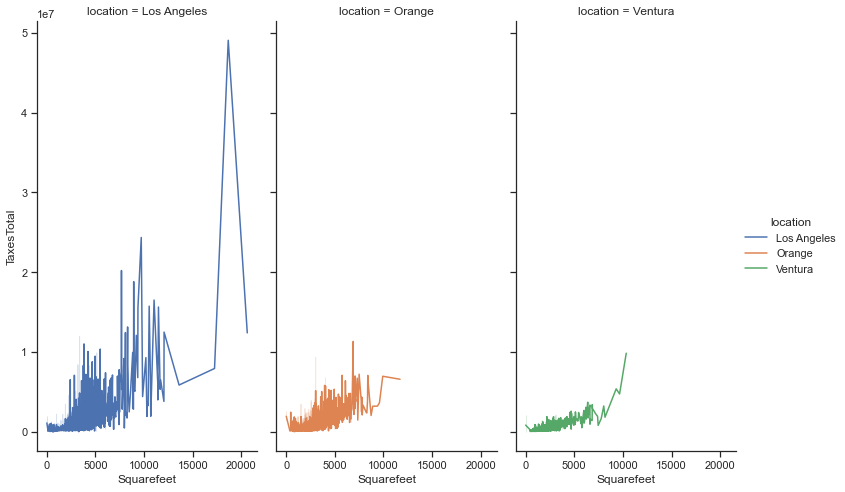

In [59]:
sns.relplot(
    data=train, x="Squarefeet", y="TaxesTotal", col="location",
    hue="location", kind="line",height=7, aspect=.5)
plt.show()

<AxesSubplot:xlabel='TaxesTotal', ylabel='Density'>

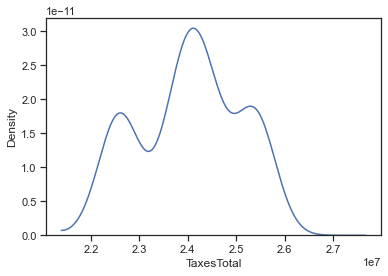

In [82]:
sns.kdeplot(data=df, x="TaxesTotal", bw_adjust=5, cut=-50)

<AxesSubplot:xlabel='TaxesTotal', ylabel='Density'>

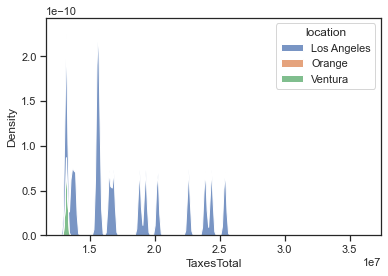

In [90]:
sns.kdeplot(data=df, x="TaxesTotal", hue="location", multiple="stack",cut=-150)

# split data:

In [34]:
df=df.dropna()
df.head()

,Bedrooms,Bathrooms,Squarefeet,TaxesTotal,Year,Fips,County,Zip,latitude,longitude,TotalRooms,Decade
0,3.0,2.0,1209.0,185000.0,1987.0,6037.0,3101.0,97328.0,34554158.0,-118074635.0,5.0,1980
1,2.0,1.0,942.0,32050.0,1908.0,6037.0,3101.0,96013.0,34089443.0,-118170716.0,3.0,1900
2,4.0,3.0,3092.0,1380739.0,1957.0,6037.0,3101.0,96412.0,34134836.0,-118476275.0,7.0,1950
3,4.0,5.0,3828.0,817802.0,1969.0,6037.0,3101.0,96100.0,33954505.0,-118118928.0,9.0,1960
4,5.0,3.0,3304.0,665343.0,1991.0,6059.0,1286.0,97078.0,33908686.0,-117760654.0,8.0,1990


In [11]:
df.isnull().sum()

Bedrooms       0
Bathrooms      0
Squarefeet     0
TaxesTotal     0
Year           0
County         0
Zip            0
latitude       0
longitude      0
TotalRooms     0
Decade         0
location       0
los_angeles    0
orange         0
ventura        0
dtype: int64

In [12]:
df.isnull().any()

Bedrooms       False
Bathrooms      False
Squarefeet     False
TaxesTotal     False
Year           False
County         False
Zip            False
latitude       False
longitude      False
TotalRooms     False
Decade         False
location       False
los_angeles    False
orange         False
ventura        False
dtype: bool

In [7]:
df=df.drop(columns=('location'))

In [8]:
#split data into 60,20,20
train, test = train_test_split(df, test_size = .2, random_state=123)
train, validate = train_test_split(train, test_size = .25, random_state=123)
train.shape,validate.shape,test.shape

((31464, 14), (10489, 14), (10489, 14))

In [9]:
#impute function in prepare file checking for missing values
train,val,test=prepare.impute_mode(train, validate, test, 'TaxesTotal')
train.shape,val.shape,test.shape

((31464, 14), (10489, 14), (10489, 14))

In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 52442 entries, 0 to 52441
Data columns (total 14 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Bedrooms     52442 non-null  float64
 1   Bathrooms    52442 non-null  float64
 2   Squarefeet   52442 non-null  float64
 3   TaxesTotal   52442 non-null  float64
 4   Year         52442 non-null  float64
 5   County       52442 non-null  float64
 6   Zip          52442 non-null  float64
 7   latitude     52442 non-null  float64
 8   longitude    52442 non-null  float64
 9   TotalRooms   52442 non-null  float64
 10  Decade       52442 non-null  int64  
 11  los_angeles  52442 non-null  int64  
 12  orange       52442 non-null  int64  
 13  ventura      52442 non-null  int64  
dtypes: float64(10), int64(4)
memory usage: 5.6 MB


# used this!!

In [19]:
#function in prepare file that would create copy of train,val,test to scaled back into a data frame
train_scaled, val_scaled, test_scaled=prepare.scale_data(train,val,test,['TaxesTotal','Bedrooms','Bathrooms',
                                                                        'Squarefeet','Decade','TotalRooms'])
train_scaled

,Bedrooms,Bathrooms,Squarefeet,TaxesTotal,Year,County,Zip,latitude,longitude,TotalRooms,Decade,los_angeles,orange,ventura
5013,0.214286,0.111111,0.066854,0.002069,1965.0,3101.0,96356.0,34277549.0,-118540495.0,0.156250,0.975124,1,0,0
47044,0.285714,0.166667,0.147535,0.023189,2012.0,1286.0,96952.0,33640785.0,-117755978.0,0.218750,0.895522,0,1,0
6590,0.142857,0.222222,0.155880,0.006572,1961.0,3101.0,96050.0,34103583.0,-118388607.0,0.187500,0.975124,1,0,0
22301,0.357143,0.250000,0.188676,0.032210,1997.0,1286.0,96978.0,33623259.0,-117903406.0,0.296875,0.990050,0,1,0
49667,0.214286,0.055556,0.057297,0.008367,1947.0,3101.0,96531.0,34084457.0,-118117865.0,0.125000,0.965174,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23135,0.214286,0.166667,0.121386,0.011004,1964.0,3101.0,96449.0,34129281.0,-118374375.0,0.187500,0.975124,1,0,0
12120,0.285714,0.222222,0.188676,0.019017,1965.0,3101.0,96426.0,34145008.0,-118477455.0,0.250000,0.975124,1,0,0
19510,0.214286,0.111111,0.085775,0.010488,1959.0,3101.0,96101.0,33939736.0,-118148834.0,0.156250,0.970149,1,0,0
17632,0.285714,0.305556,0.356879,0.029643,1981.0,1286.0,97067.0,33794137.0,-117777365.0,0.296875,0.985075,0,1,0


In [8]:
train, validate, test, X_train, y_train, X_validate, y_validate, X_test, y_test=prepare.prepare_zillow_train(df,'TaxesTotal',['Bedrooms'])

In [13]:
train.shape,validate.shape,test.shape

((28511, 15), (12219, 15), (10183, 15))

# not this 

In [21]:
scaler = sklearn.preprocessing.MinMaxScaler()
# Note that we only call .fit with the training data,
# but we use .transform to apply the scaling to all the data splits.
scaler.fit(train)

train_scaled = scaler.transform(train)
validate_scaled = scaler.transform(validate)
test_scaled = scaler.transform(test)

In [23]:
train_scaled

array([[0.21428571, 0.11111111, 0.06685426, ..., 1.        , 0.        ,
        0.        ],
       [0.28571429, 0.16666667, 0.14753542, ..., 0.        , 1.        ,
        0.        ],
       [0.14285714, 0.22222222, 0.15588007, ..., 1.        , 0.        ,
        0.        ],
       ...,
       [0.21428571, 0.11111111, 0.08577528, ..., 1.        , 0.        ,
        0.        ],
       [0.28571429, 0.30555556, 0.35687949, ..., 0.        , 1.        ,
        0.        ],
       [0.21428571, 0.05555556, 0.03260237, ..., 1.        , 0.        ,
        0.        ]])

Text(0.5, 1.0, 'Scaled')

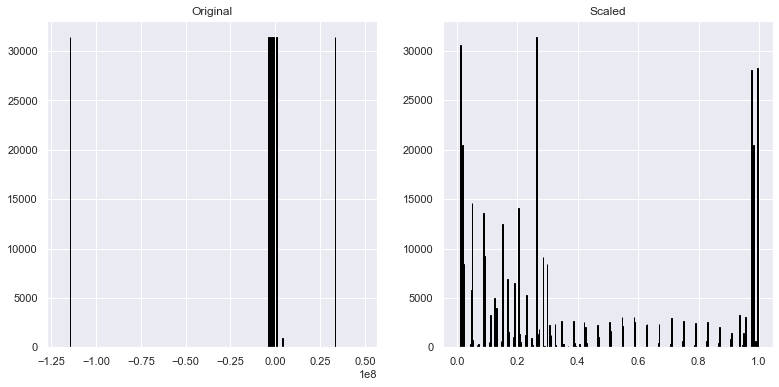

In [51]:
plt.figure(figsize=(13, 6))
plt.subplot(121)
plt.hist(train, bins=25, ec='black')
plt.title('Original')
plt.subplot(122)
plt.hist(train_scaled, bins=25, ec='black')
plt.title('Scaled')

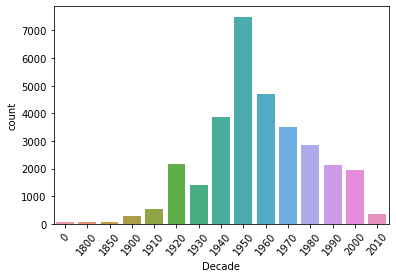

In [17]:
sns.countplot(x='Decade', data=train)
plt.xticks(rotation=50)
plt.show()

In [19]:
zip_count = df['Zip'].value_counts().to_dict()
df['N-zip_count'] = df['Zip'].map(zip_count)

In [9]:
df.nunique()

2

<Figure size 360x720 with 0 Axes>

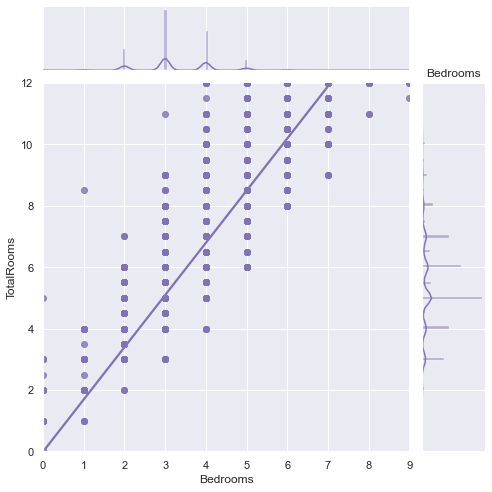

In [7]:
plt.figure(figsize=(5,10))
sns.set_theme(style="darkgrid")
sns.jointplot(x="Bedrooms",y='TotalRooms', data=df,
                  kind="reg", truncate=False,
                  xlim=(0,9),ylim=(0, 12),
                  color="m", height=7)
plt.title('Bedrooms')
plt.show()

<Figure size 360x360 with 0 Axes>

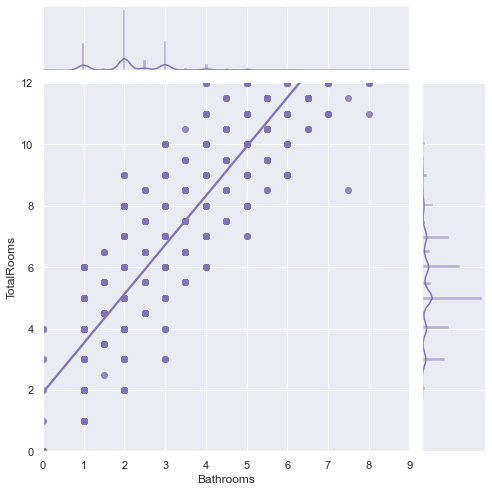

In [49]:
plt.figure(figsize=(5,5))
sns.set_theme(style="darkgrid")
sns.jointplot(x="Bathrooms",y='TotalRooms', data=train,
                  kind="reg", truncate=False,
                  xlim=(0,9),ylim=(0, 12),
                  color="m", height=7)

In [14]:
df['yhat_baseline'] = df['TaxesTotal'].mean()
df.head()

,Bedrooms,Bathrooms,Squarefeet,TaxesTotal,Year,County,Zip,latitude,longitude,TotalRooms,Decade,los_angeles,orange,ventura,yhat_baseline
0,3.0,2.0,1209.0,185000.0,1987.0,3101.0,97328.0,34554158.0,-118074635.0,5.0,1980,1,0,0,529672.908165
1,2.0,1.0,942.0,32050.0,1908.0,3101.0,96013.0,34089443.0,-118170716.0,3.0,1900,1,0,0,529672.908165
2,4.0,3.0,3092.0,1380739.0,1957.0,3101.0,96412.0,34134836.0,-118476275.0,7.0,1950,1,0,0,529672.908165
3,4.0,5.0,3828.0,817802.0,1969.0,3101.0,96100.0,33954505.0,-118118928.0,9.0,1960,1,0,0,529672.908165
4,5.0,3.0,3304.0,665343.0,1991.0,1286.0,97078.0,33908686.0,-117760654.0,8.0,1990,0,1,0,529672.908165


# exploration:

# questions:
`Hypothesis(1)-Do bedrooms increase price:`

Ho-Does more Bed rooms increase the cost of the houses?

Ha-Bed rooms has no effect on pricing of house

`Hypothesis(2)-Does squarefeet effect cost of housing:`

Ho-Would the amount of squarefeet effect the cost of housing?

Ha-squarefeet as no effect on housing


`Hypothesis(3)-What decade does the market love:`

Ho-Would decade effect total cost of the house ?

Ha-Decade has no effect on total cost of market 

`Hypothesis(4)-Do Bathrooms have a big effect on pricing:`

Ho-Does more bathrooms increase the cost of the houses?

Ha-Bathrooms has no effect on pricing of house

`Hypothesis(5)-Does county have a impact on taxtotal:`

Ho-Does county have a impact on taxtotal?

Ha-county doesnt have a impact on taxtotal

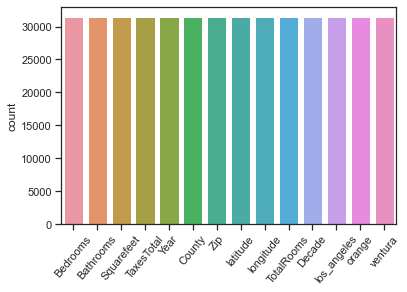

In [26]:
sns.countplot(data=train)
plt.xticks(rotation=50)
plt.show()

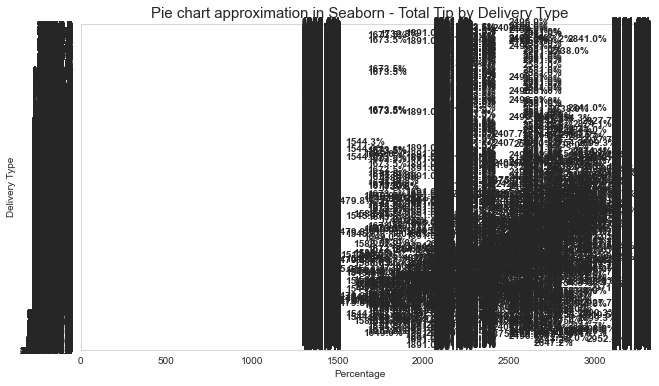

In [32]:
sns.set_style("whitegrid")
bar,ax = plt.subplots(figsize=(10,6))
ax = sns.barplot(x="County", y='TaxesTotal', data=df, ci=None, palette="muted",orient='h' )
ax.set_title("Pie chart approximation in Seaborn - Total Tip by Delivery Type", fontsize=15)
ax.set_xlabel ("Percentage")
ax.set_ylabel ("Delivery Type")
for rect in ax.patches:
    ax.text (rect.get_width(), rect.get_y() + rect.get_height() / 2,"%.1f%%"% rect.get_width(), weight='bold' )
bar.savefig("Seaborn_Bar_Vertical.png");

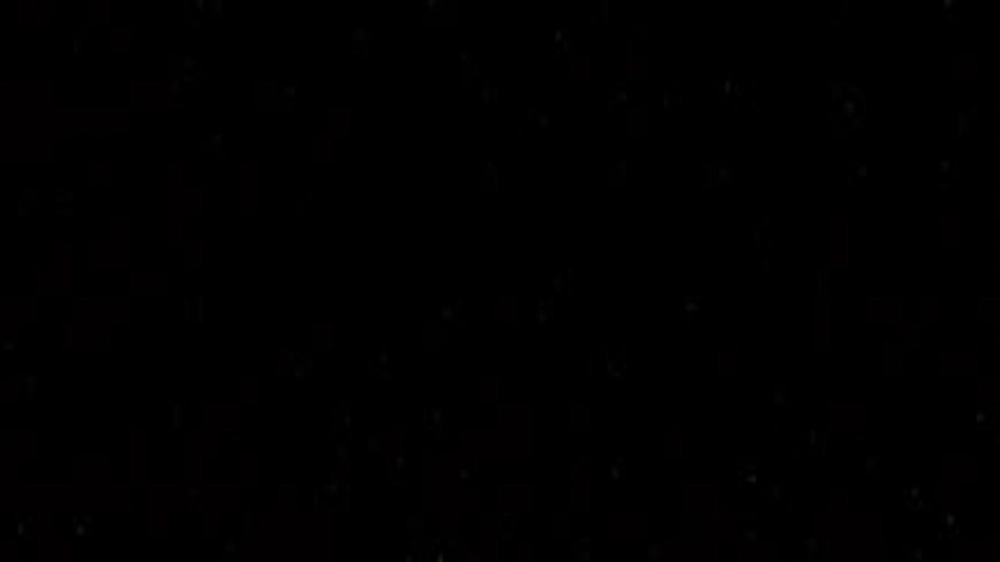# 

In [25]:
import altair as alt
from vega_datasets import data

brush = alt.selection(type='interval')
alt.data_transformers.disable_max_rows()
points = alt.Chart(df).mark_point().encode(
    x='Bedrooms',
    y='TotalRooms',
    color=alt.condition(brush, 'TaxesTotal', alt.value('lightgray'))
).add_selection(
    brush
)

bars = alt.Chart(df).mark_bar().encode(
    y='TaxesTotal',
    color='location',
    x='count(TaxesTotal)'
).transform_filter(
    brush
)

points & bars 

alt.VConcatChart(...)

In [74]:
import plotly.express as px
geojson=px.choropleth_mapbox
location=df.longitude + df.latitude
fig = px.choropleth(df, geojson=geojson, 
                    locations=location, featureidkey="properties.location",color="location",
                    center={'lat': 38.7200, 'lon': 34.0000},
                    projection="mercator"
                   )
fig.update_geos(fitbounds="locations", visible=False)
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

TypeError: Object of type function is not JSON serializable